In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

🔍 Exploring dataset structure...

📁 Files in /kaggle/input/road-sign-detection:
road-sign-detection/
  annotations/
    road732.xml
    road518.xml
    road717.xml
    road362.xml
    road492.xml
    ... and 872 more files
  images/
    road348.png
    road259.png
    road406.png
    road589.png
    road83.png
    ... and 872 more files

📊 Loading dataset files...
No CSV files found. Looking for images...

🖼️ Found 877 images
Sample image paths:
  • /kaggle/input/road-sign-detection/images/road348.png
  • /kaggle/input/road-sign-detection/images/road259.png
  • /kaggle/input/road-sign-detection/images/road406.png

📋 Found 877 XML annotation files
Sample XML files:
  • /kaggle/input/road-sign-detection/annotations/road732.xml
  • /kaggle/input/road-sign-detection/annotations/road518.xml
  • /kaggle/input/road-sign-detection/annotations/road717.xml

🖼️ Displaying sample images:


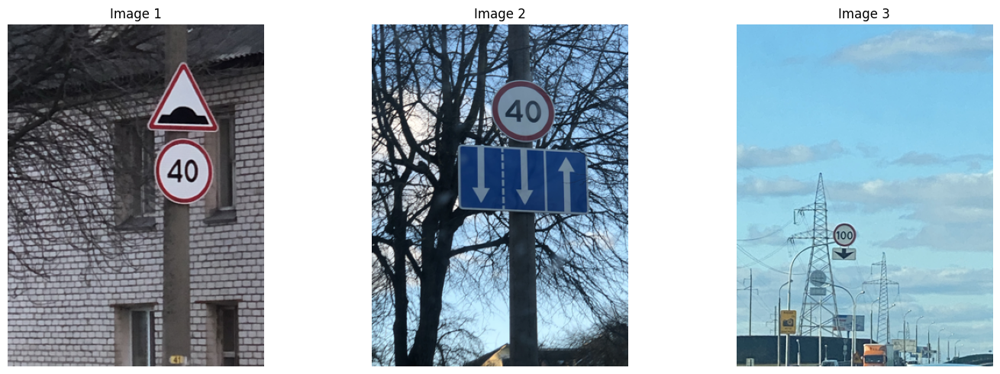


📋 Sample XML annotation:
Filename: road732.png
Image size: 300x400
Number of objects: 2
First object: {'name': 'speedlimit', 'xmin': 99, 'ymin': 97, 'xmax': 159, 'ymax': 157}

✅ Dataset exploration complete!

💡 Next steps:
  1. Process annotations to create training labels
  2. Split data into train/val/test sets
  3. Implement data augmentation
  4. Train your road sign detection model!


In [3]:
# Step 1: Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from PIL import Image
import glob

# Step 2: Access dataset from Kaggle input directory
print("🔍 Exploring dataset structure...")
dataset_path = "/kaggle/input/road-sign-detection"

# List all files in the dataset
print(f"\n📁 Files in {dataset_path}:")
try:
    for root, dirs, files in os.walk(dataset_path):
        level = root.replace(dataset_path, '').count(os.sep)
        indent = ' ' * 2 * level
        print(f'{indent}{os.path.basename(root)}/')
        subindent = ' ' * 2 * (level + 1)
        for file in files[:5]:  # Show first 5 files
            print(f'{subindent}{file}')
        if len(files) > 5:
            print(f'{subindent}... and {len(files)-5} more files')
except Exception as e:
    print(f"Error accessing path: {e}")

# Step 3: Load annotations/labels if available
print("\n📊 Loading dataset files...")

# Look for CSV files (annotations)
csv_files = glob.glob(os.path.join(dataset_path, "**/*.csv"), recursive=True)
if csv_files:
    print(f"Found CSV files: {csv_files}")
    for csv_file in csv_files:
        try:
            df = pd.read_csv(csv_file)
            print(f"\n✅ Loaded {os.path.basename(csv_file)}")
            print(f"Shape: {df.shape}")
            print("Columns:", list(df.columns))
            print("\nFirst 5 records:")
            print(df.head())
            break  # Use first CSV file found
        except Exception as e:
            print(f"Error loading {csv_file}: {e}")
            continue
else:
    print("No CSV files found. Looking for images...")

# Step 4: Find image files
image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp']
all_images = []
for ext in image_extensions:
    all_images.extend(glob.glob(os.path.join(dataset_path, "**/" + ext), recursive=True))

print(f"\n🖼️ Found {len(all_images)} images")
if all_images:
    print("Sample image paths:")
    for img_path in all_images[:3]:
        print(f"  • {img_path}")

# Step 5: Look for XML annotations (PASCAL VOC format)
xml_files = glob.glob(os.path.join(dataset_path, "**/*.xml"), recursive=True)
if xml_files:
    print(f"\n📋 Found {len(xml_files)} XML annotation files")
    print("Sample XML files:")
    for xml_file in xml_files[:3]:
        print(f"  • {xml_file}")

# Step 6: Create a simple function to load and display images
def load_sample_images(image_paths, num_samples=3):
    """Load and display sample images"""
    if not image_paths:
        print("No images found to display")
        return
    
    fig, axes = plt.subplots(1, min(num_samples, len(image_paths)), figsize=(15, 5))
    if min(num_samples, len(image_paths)) == 1:
        axes = [axes]
    
    for i in range(min(num_samples, len(image_paths))):
        try:
            # Load image using cv2
            image = cv2.imread(image_paths[i])
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
            axes[i].imshow(image)
            axes[i].set_title(f'Image {i+1}')
            axes[i].axis('off')
            
        except Exception as e:
            print(f"Error loading image {image_paths[i]}: {e}")
    
    plt.tight_layout()
    plt.show()

# Step 7: Display sample images if available
if all_images:
    print("\n🖼️ Displaying sample images:")
    load_sample_images(all_images, 3)

# Step 8: Parse XML annotations if available (PASCAL VOC format)
def parse_pascal_voc_xml(xml_file):
    """Parse PASCAL VOC format XML file"""
    try:
        import xml.etree.ElementTree as ET
        tree = ET.parse(xml_file)
        root = tree.getroot()
        
        annotations = {
            'filename': root.find('filename').text if root.find('filename') is not None else '',
            'width': int(root.find('size/width').text) if root.find('size/width') is not None else 0,
            'height': int(root.find('size/height').text) if root.find('size/height') is not None else 0,
            'objects': []
        }
        
        for obj in root.findall('object'):
            bbox = obj.find('bndbox')
            if bbox is not None:
                annotations['objects'].append({
                    'name': obj.find('name').text if obj.find('name') is not None else '',
                    'xmin': int(bbox.find('xmin').text),
                    'ymin': int(bbox.find('ymin').text),
                    'xmax': int(bbox.find('xmax').text),
                    'ymax': int(bbox.find('ymax').text)
                })
        
        return annotations
    except Exception as e:
        print(f"Error parsing XML: {e}")
        return None

# Test XML parsing on first file if available
if xml_files:
    print("\n📋 Sample XML annotation:")
    sample_annotation = parse_pascal_voc_xml(xml_files[0])
    if sample_annotation:
        print(f"Filename: {sample_annotation['filename']}")
        print(f"Image size: {sample_annotation['width']}x{sample_annotation['height']}")
        print(f"Number of objects: {len(sample_annotation['objects'])}")
        if sample_annotation['objects']:
            print("First object:", sample_annotation['objects'][0])

print("\n✅ Dataset exploration complete!")
print("\n💡 Next steps:")
print("  1. Process annotations to create training labels")
print("  2. Split data into train/val/test sets")  
print("  3. Implement data augmentation")
print("  4. Train your road sign detection model!")


In [6]:
%%bash
git clone https://github.com/ultralytics/yolov5
cd yolov5 
pip install -r requirements.txt

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [13]:
%%bash
# Create target dirs
mkdir -p ./data/images
mkdir -p ./data/labels

# Copy images
cp -r /kaggle/input/road-sign-detection/images/* ./data/images/

# Copy annotations (XMLs)
cp -r /kaggle/input/road-sign-detection/annotations/* ./data/labels/

# Quick check
echo "Images count:" $(find ./data/images -type f | wc -l)
echo "XML count:" $(find ./data/labels -name "*.xml" | wc -l)


Images count: 877
XML count: 877


In [8]:
%%writefile preprocess.py
import os 
import xml.etree.ElementTree as ET

def convert_box(size, box):
    dw, dh = 1. / size[0], 1. / size[1]
    x = ((box[0] + box[1]) / 2.0) - 1
    y = ((box[2] + box[3]) / 2.0) - 1
    w = box[1] - box[0]
    h = box[3] - box[2]
    return x * dw, y * dh, w * dw, h * dh

def convert_voc_to_yolo():
    for anno in os.listdir('./data/labels'):
        if anno.split('.')[-1] == 'xml':
            file_name = anno.split('.')[0]
            out_file = open(f'./data/labels/{file_name}.txt', 'w')

            tree = ET.parse(os.path.join('data', 'labels', anno))
            root = tree.getroot()
            size = root.find('size')        
            w = int(size.find('width').text)
            h = int(size.find('height').text)

            names = ['trafficlight', 'speedlimit', 'crosswalk', 'stop']

            for obj in root.iter('object'):
                cls = obj.find('name').text
                if cls in names and int(obj.find('difficult').text) != 1:
                    xmlbox = obj.find('bndbox')
                    bb = convert_box((w, h), [float(xmlbox.find(x).text) for x in ('xmin', 'xmax', 'ymin', 'ymax')])
                    cls_id = names.index(cls)  # class id
                    out_file.write(" ".join([str(a) for a in (cls_id, *bb)]) + '\n')
            out_file.close()
    print("VOC annotations converted to YOLO format.")


Writing preprocess.py


In [14]:
from preprocess import convert_voc_to_yolo



In [15]:
convert_voc_to_yolo()

VOC annotations converted to YOLO format.


In [16]:
import os
import glob

images_dir = "./data/images"
labels_dir = "./data/labels"  # where your .txt were created
image_exts = (".jpg", ".jpeg", ".png", ".bmp")

def check_label_line(line, n_classes=4):
    parts = line.strip().split()
    if len(parts) != 5:
        return False, "Expected 5 values (class cx cy w h)"
    try:
        cls = int(parts[0])
        cx, cy, w, h = map(float, parts[1:])
    except ValueError:
        return False, "Non-numeric value found"
    if not (0 <= cls < n_classes):
        return False, f"class_id {cls} out of range [0,{n_classes-1}]"
    for v, name in zip([cx, cy, w, h], ["cx", "cy", "w", "h"]):
        if not (0.0 <= v <= 1.0):
            return False, f"{name}={v} not in [0,1]"
    return True, "ok"

# Collect images
all_images = []
for ext in image_exts:
    all_images.extend(glob.glob(os.path.join(images_dir, f"**/*{ext}"), recursive=True))

print(f"Found {len(all_images)} images under {images_dir}")

missing_label = []
bad_labels = []
ok_samples_printed = 0

for img_path in all_images:
    rel = os.path.splitext(os.path.relpath(img_path, images_dir))[0]
    lbl_path = os.path.join(labels_dir, rel + ".txt")

    if not os.path.exists(lbl_path):
        missing_label.append((img_path, lbl_path))
        continue

    try:
        with open(lbl_path, "r") as f:
            lines = [ln for ln in (l.strip() for l in f) if ln]
    except Exception as e:
        bad_labels.append((lbl_path, f"read_error: {e}"))
        continue

    if not lines:
        bad_labels.append((lbl_path, "empty_file"))
        continue

    for li, line in enumerate(lines, 1):
        ok, msg = check_label_line(line, n_classes=4)
        if not ok:
            bad_labels.append((lbl_path, f"line {li}: {msg}"))
            break  # report first error per file

    # Print a couple of good examples
    if ok and ok_samples_printed < 3:
        print("\nExample OK pair:")
        print(" Image:", img_path)
        print(" Label:", lbl_path)
        print(" First line:", lines[0])
        ok_samples_printed += 1

print("\nSummary:")
print(" Missing label files:", len(missing_label))
print(" Bad label files:", len(bad_labels))

# Show a few problems if any
for i, (img, lbl) in enumerate(missing_label[:5], 1):
    print(f"Missing {i}: image={img} expected_label={lbl}")

for i, (lbl, reason) in enumerate(bad_labels[:5], 1):
    print(f"Bad {i}: label={lbl} reason={reason}")


Found 877 images under ./data/images

Example OK pair:
 Image: ./data/images/road258.png
 Label: ./data/labels/road258.txt
 First line: 1 0.5166666666666667 0.3775 0.13333333333333333 0.105

Example OK pair:
 Image: ./data/images/road545.png
 Label: ./data/labels/road545.txt
 First line: 1 0.32833333333333337 0.54625 0.15000000000000002 0.1075

Example OK pair:
 Image: ./data/images/road230.png
 Label: ./data/labels/road230.txt
 First line: 1 0.43333333333333335 0.4975 0.04666666666666667 0.035

Summary:
 Missing label files: 0
 Bad label files: 0


In [17]:
%%bash
#cp yolov5/data/VOC.yaml yolov5/VOC.yaml 

In [34]:
%%bash
set -e

IMAGES=/kaggle/working/data/images
LABELS=/kaggle/working/data/labels
ROOT=/kaggle/working/data

# Sanity checks
[ -d "$IMAGES" ] || { echo "Missing images at $IMAGES"; exit 1; }
[ -d "$LABELS" ] || { echo "Missing labels at $LABELS"; exit 1; }

# Make split dirs
mkdir -p $ROOT/images/train $ROOT/images/val
mkdir -p $ROOT/labels/train $ROOT/labels/val

# Build file list (jpg/jpeg/png supported)
python - <<'PY'
import os, glob, random, shutil

IMAGES="/kaggle/working/data/images"
LABELS="/kaggle/working/data/labels"
TR_IM="/kaggle/working/data/images/train"
VL_IM="/kaggle/working/data/images/val"
TR_LB="/kaggle/working/data/labels/train"
VL_LB="/kaggle/working/data/labels/val"

# Collect images
ex = ("*.jpg","*.jpeg","*.png","*.bmp")
imgs=[]
for e in ex:
    imgs.extend(glob.glob(os.path.join(IMAGES,"**",e), recursive=True))
imgs = sorted(imgs)
if not imgs:
    raise SystemExit("No images found in /kaggle/working/data/images")

# Shuffle and split
random.seed(42)
random.shuffle(imgs)
n = len(imgs)
split = int(0.8*n)
train_imgs = imgs[:split]
val_imgs = imgs[split:]

def move_pair(img_path, to_im_dir, to_lb_dir):
    base = os.path.splitext(os.path.basename(img_path))[0]
    lbl = None
    # Try .txt in labels with same basename
    cand = os.path.join(LABELS, base + ".txt")
    if os.path.exists(cand):
        lbl = cand
    else:
        # also try searching recursively (in case labels kept subdirs)
        matches = glob.glob(os.path.join(LABELS, "**", base + ".txt"), recursive=True)
        if matches:
            lbl = matches[0]
    # Move/copy image
    shutil.copy2(img_path, os.path.join(to_im_dir, os.path.basename(img_path)))
    # Move/copy label if exists
    if lbl and os.path.exists(lbl):
        shutil.copy2(lbl, os.path.join(to_lb_dir, os.path.basename(lbl)))
    else:
        # create empty label to keep pairing consistent if desired
        open(os.path.join(to_lb_dir, base + ".txt"), "w").close()

for p in train_imgs:
    move_pair(p, TR_IM, TR_LB)
for p in val_imgs:
    move_pair(p, VL_IM, VL_LB)

print("Train images:", len(train_imgs))
print("Val images:", len(val_imgs))
PY


Train images: 701
Val images: 176


In [18]:
%%writefile /kaggle/working/roadsign.yaml
# Custom Road Sign dataset (minimal)
path: ../data
train:
  - images
val:
  - images

names:
  0: trafficlight
  1: speedlimit
  2: crosswalk
  3: stop


Writing /kaggle/working/roadsign.yaml


In [35]:
import os, glob

BASE = "/kaggle/working/data"
dirs = {
    "images_train": os.path.join(BASE, "images/train"),
    "images_val": os.path.join(BASE, "images/val"),
    "labels_train": os.path.join(BASE, "labels/train"),
    "labels_val": os.path.join(BASE, "labels/val"),
}

# 1) Existence check
for name, path in dirs.items():
    print(f"{name}: {'OK' if os.path.isdir(path) else 'MISSING'} -> {path}")

# 2) File counts
def count_files(path, exts=None):
    if not os.path.isdir(path):
        return 0
    if exts is None:
        return sum(len(files) for _,_,files in os.walk(path))
    files = []
    for e in exts:
        files += glob.glob(os.path.join(path, f"**/*{e}"), recursive=True)
    return len(files)

img_exts = [".jpg", ".jpeg", ".png", ".bmp"]
print("\nCounts:")
print(" images/train:", count_files(dirs["images_train"], img_exts))
print(" images/val  :", count_files(dirs["images_val"], img_exts))
print(" labels/train:", count_files(dirs["labels_train"], [".txt"]))
print(" labels/val  :", count_files(dirs["labels_val"], [".txt"]))

# 3) Sample pairing and missing labels report
def sample_pairs(img_dir, lbl_dir, max_show=5):
    imgs = []
    for e in img_exts:
        imgs += glob.glob(os.path.join(img_dir, f"**/*{e}"), recursive=True)
    imgs = sorted(imgs)
    print(f"\nSample pairs from {img_dir}:")
    shown = 0
    missing = 0
    for img in imgs[:max_show]:
        stem = os.path.splitext(os.path.basename(img))[0]
        lbl = os.path.join(lbl_dir, stem + ".txt")
        ok = os.path.exists(lbl)
        print(" OK " if ok else " MIS", " IMG:", os.path.basename(img), "LBL:", os.path.basename(lbl))
        if ok:
            shown += 1
        else:
            missing += 1
    if len(imgs) > max_show:
        print(f"... and {len(imgs)-max_show} more images")
    # Scan all for total missing
    total_missing = 0
    for img in imgs:
        stem = os.path.splitext(os.path.basename(img))[0]
        lbl = os.path.join(lbl_dir, stem + ".txt")
        if not os.path.exists(lbl):
            total_missing += 1
    print(f"Total missing labels in this split: {total_missing} of {len(imgs)}")

sample_pairs(dirs["images_train"], dirs["labels_train"])
sample_pairs(dirs["images_val"], dirs["labels_val"])


images_train: OK -> /kaggle/working/data/images/train
images_val: OK -> /kaggle/working/data/images/val
labels_train: OK -> /kaggle/working/data/labels/train
labels_val: OK -> /kaggle/working/data/labels/val

Counts:
 images/train: 701
 images/val  : 176
 labels/train: 701
 labels/val  : 176

Sample pairs from /kaggle/working/data/images/train:
 OK   IMG: road0.png LBL: road0.txt
 OK   IMG: road1.png LBL: road1.txt
 OK   IMG: road10.png LBL: road10.txt
 OK   IMG: road101.png LBL: road101.txt
 OK   IMG: road102.png LBL: road102.txt
... and 696 more images
Total missing labels in this split: 0 of 701

Sample pairs from /kaggle/working/data/images/val:
 OK   IMG: road100.png LBL: road100.txt
 OK   IMG: road103.png LBL: road103.txt
 OK   IMG: road108.png LBL: road108.txt
 OK   IMG: road120.png LBL: road120.txt
 OK   IMG: road122.png LBL: road122.txt
... and 171 more images
Total missing labels in this split: 0 of 176


In [ ]:
import os, sys, subprocess, shlex

os.chdir("/kaggle/working/yolov5")
cmd = (
    "python -u train.py "
    "--img 320 "
    "--batch 16 "
    "--epochs 100 "
    "--data /kaggle/working/roadsign.yaml "
    "--weights yolov5s.pt "
    "--workers 2 "
    "--project runs/train "
    "--name roadsign_320s "
    "--exist-ok"
)
print("Running:", cmd)
proc = subprocess.Popen(
    shlex.split(cmd),
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
    bufsize=1,
)
try:
    for line in proc.stdout:
        print(line, end="")  # stream each line
finally:
    proc.stdout.close()
    proc.wait()
    print("\nExit code:", proc.returncode)


Running: python -u train.py --img 320 --batch 16 --epochs 100 --data /kaggle/working/roadsign.yaml --weights yolov5s.pt --workers 2 --project runs/train --name roadsign_320s --exist-ok
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-09-30 06:22:41.933858: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1759213361.957430    1794 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1759213361.964341    1794 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/kaggle/working/roadsign.yaml, hyp=data/hyps/hyp.scra

In [39]:
%%bash
RUN=/kaggle/working/yolov5/runs/train/roadsign_320s
echo "Run dir: $RUN"
echo "Top-level contents:"
ls -lah "$RUN"

echo ""
echo "Weights:"
ls -lah "$RUN/weights" || true

echo ""
echo "Curves and previews:"
ls -lah "$RUN" | egrep "results|curve|confusion|batch|labels" || true


Run dir: /kaggle/working/yolov5/runs/train/roadsign_320s
Top-level contents:
total 4.9M
drwxr-xr-x 3 root root 4.0K Sep 30 07:38 .
drwxr-xr-x 4 root root 4.0K Sep 30 06:19 ..
-rw-r--r-- 1 root root 121K Sep 30 07:38 confusion_matrix.png
-rw-r--r-- 1 root root 288K Sep 30 06:20 events.out.tfevents.1759213195.47a36a825ce4.1465.0
-rw-r--r-- 1 root root 1.2M Sep 30 07:38 events.out.tfevents.1759213364.47a36a825ce4.1794.0
-rw-r--r-- 1 root root 171K Sep 30 07:38 F1_curve.png
-rw-r--r-- 1 root root  373 Sep 30 06:22 hyp.yaml
-rw-r--r-- 1 root root 228K Sep 30 06:22 labels_correlogram.jpg
-rw-r--r-- 1 root root 173K Sep 30 06:22 labels.jpg
-rw-r--r-- 1 root root 1.2K Sep 30 06:22 opt.yaml
-rw-r--r-- 1 root root 139K Sep 30 07:38 P_curve.png
-rw-r--r-- 1 root root 101K Sep 30 07:38 PR_curve.png
-rw-r--r-- 1 root root 144K Sep 30 07:38 R_curve.png
-rw-r--r-- 1 root root  30K Sep 30 07:38 results.csv
-rw-r--r-- 1 root root 246K Sep 30 07:38 results.png
-rw-r--r-- 1 root root 241K Sep 30 06:22 tr

Showing: results.png


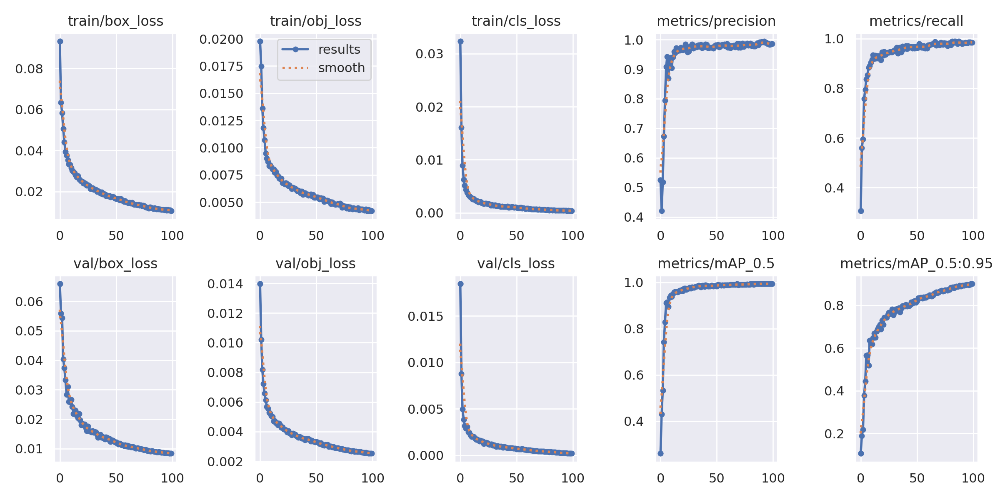

Showing: PR_curve.png


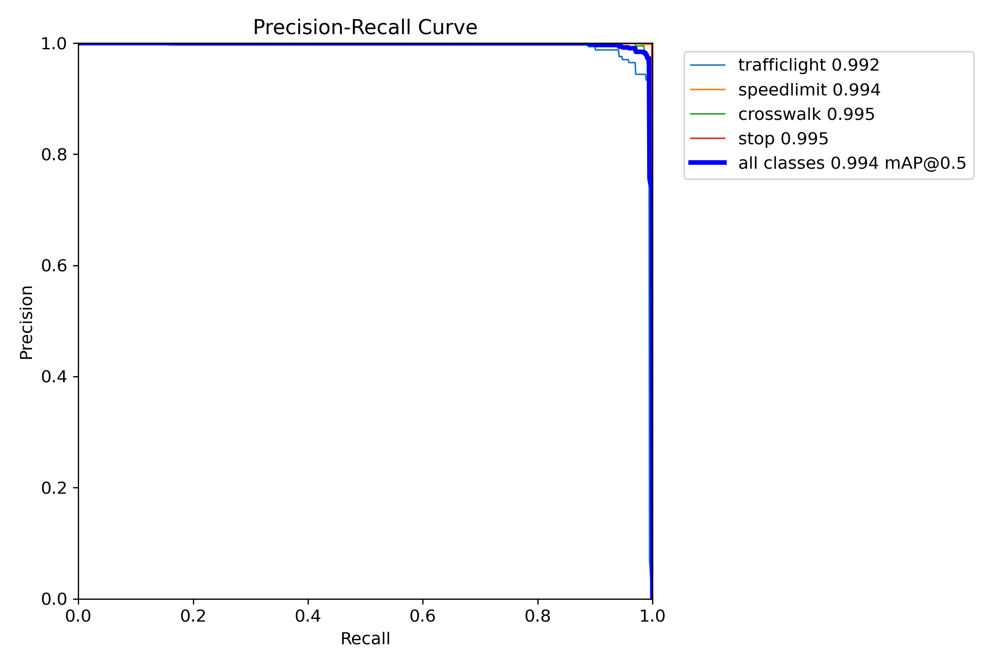

Showing: P_curve.png


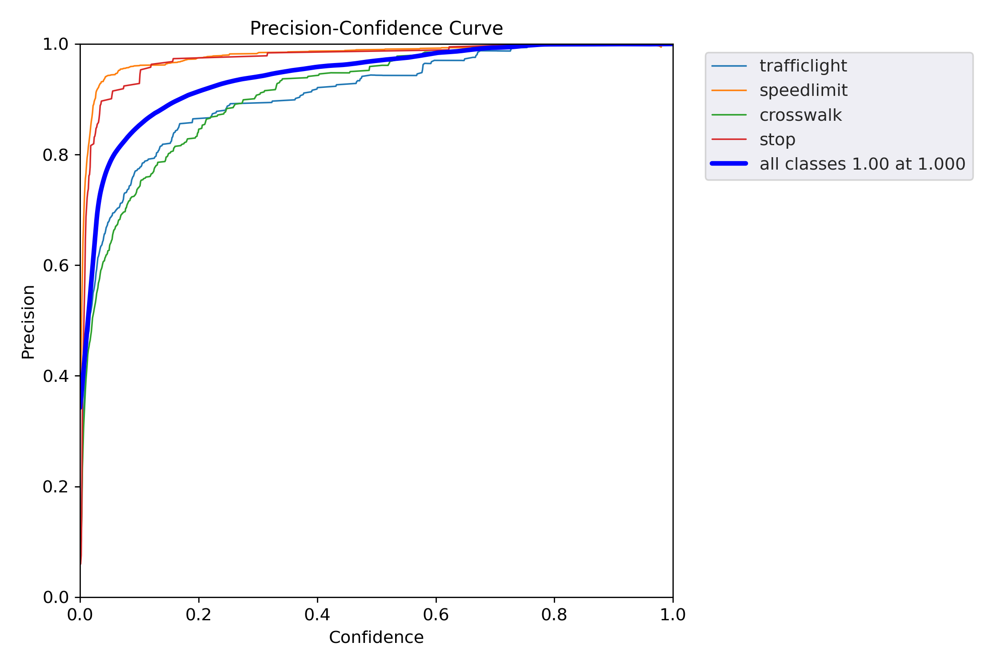

Showing: R_curve.png


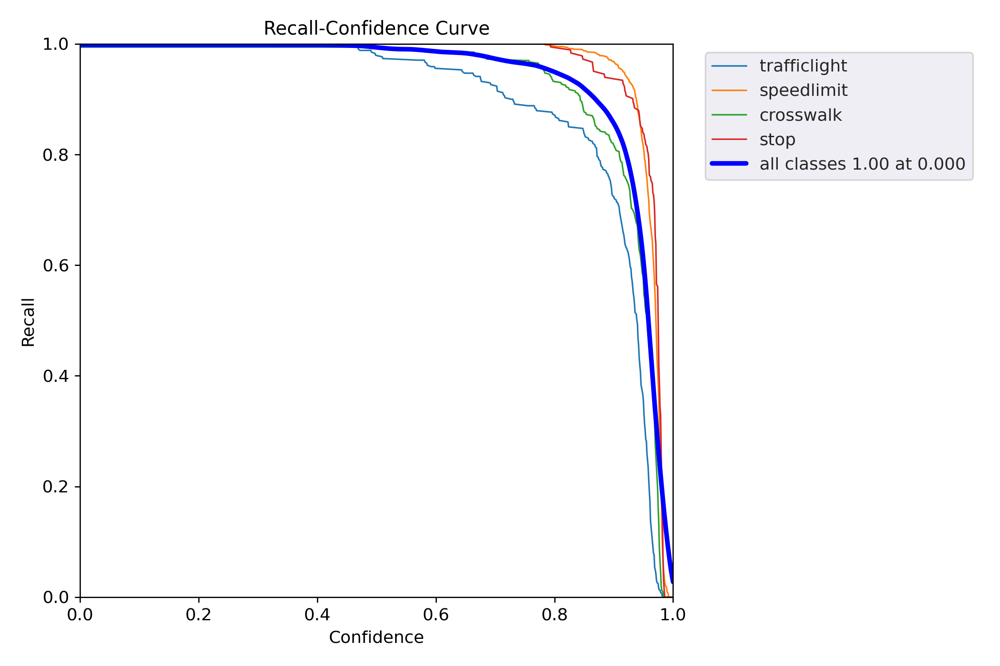

Showing: F1_curve.png


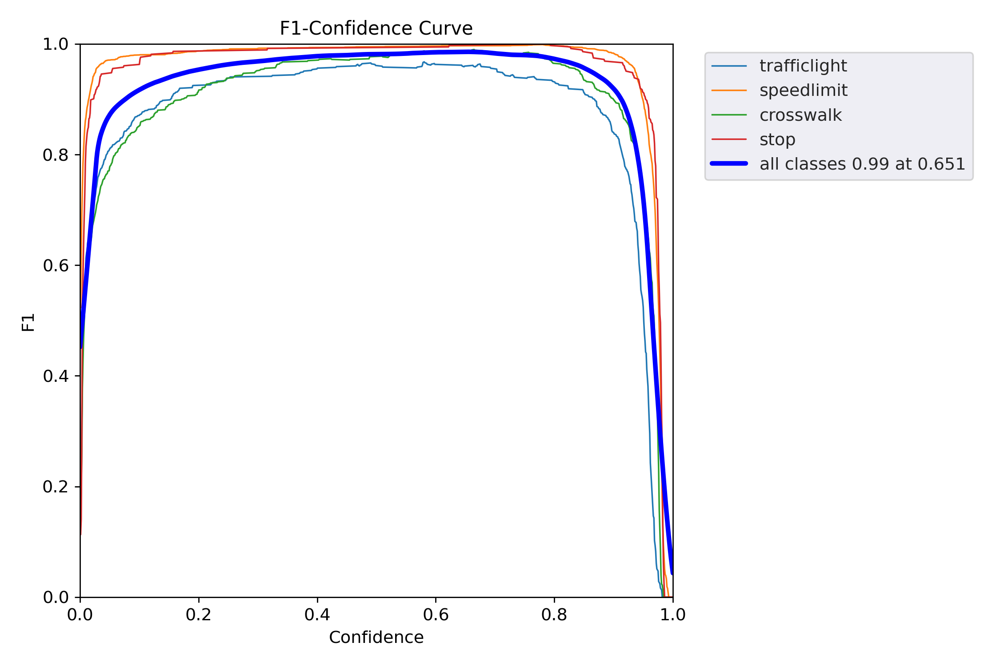

Showing: confusion_matrix.png


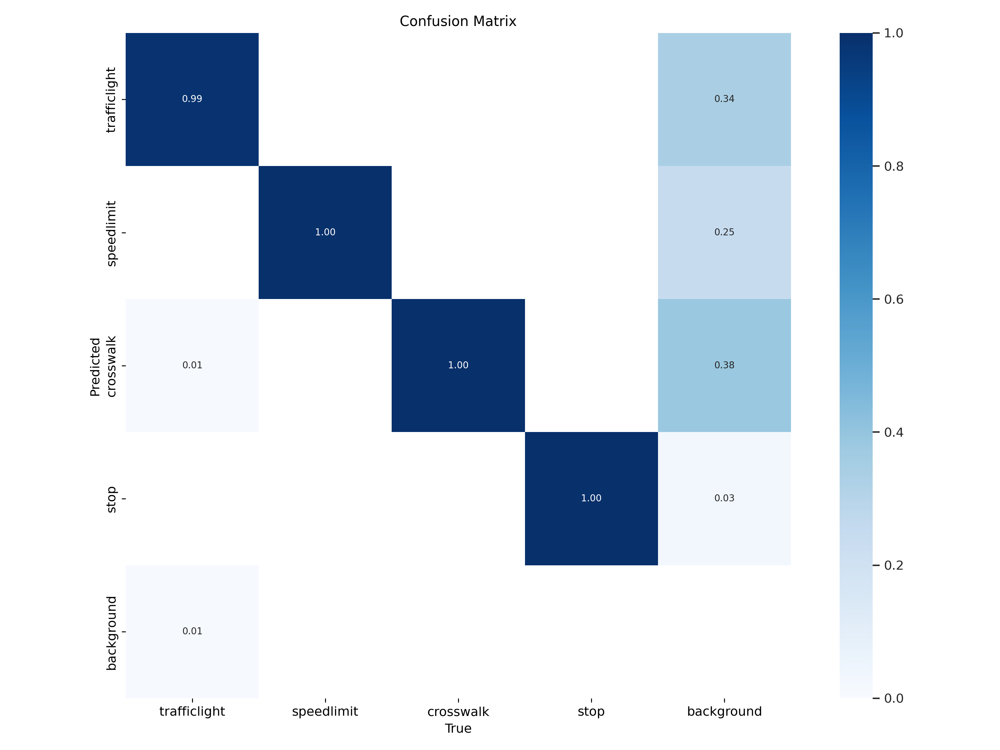

Showing: val_batch0_pred.jpg


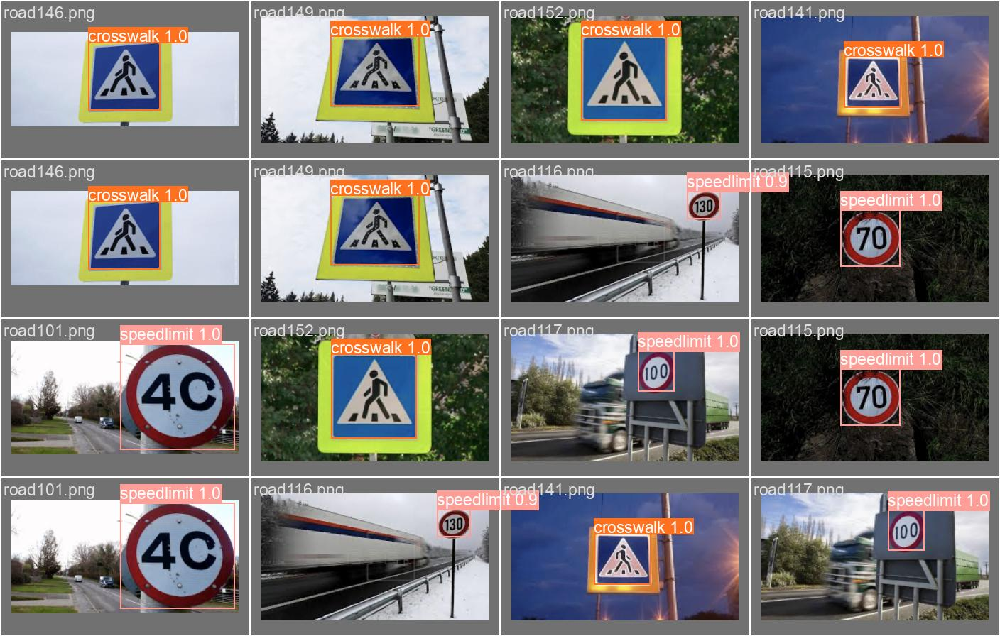

Showing: val_batch1_pred.jpg


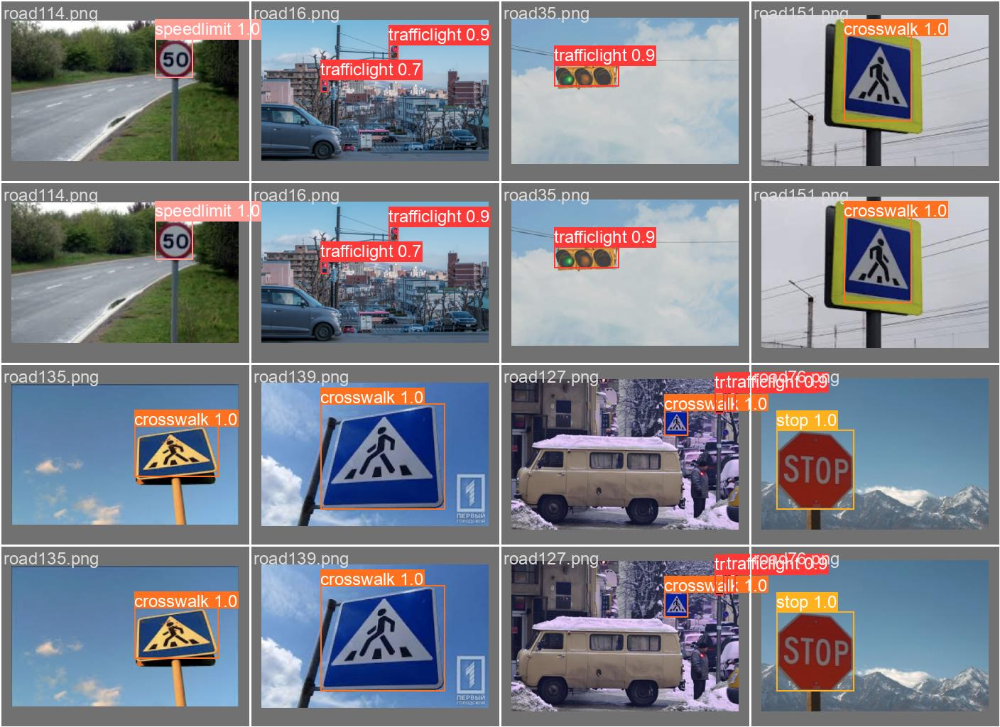

Showing: val_batch2_pred.jpg


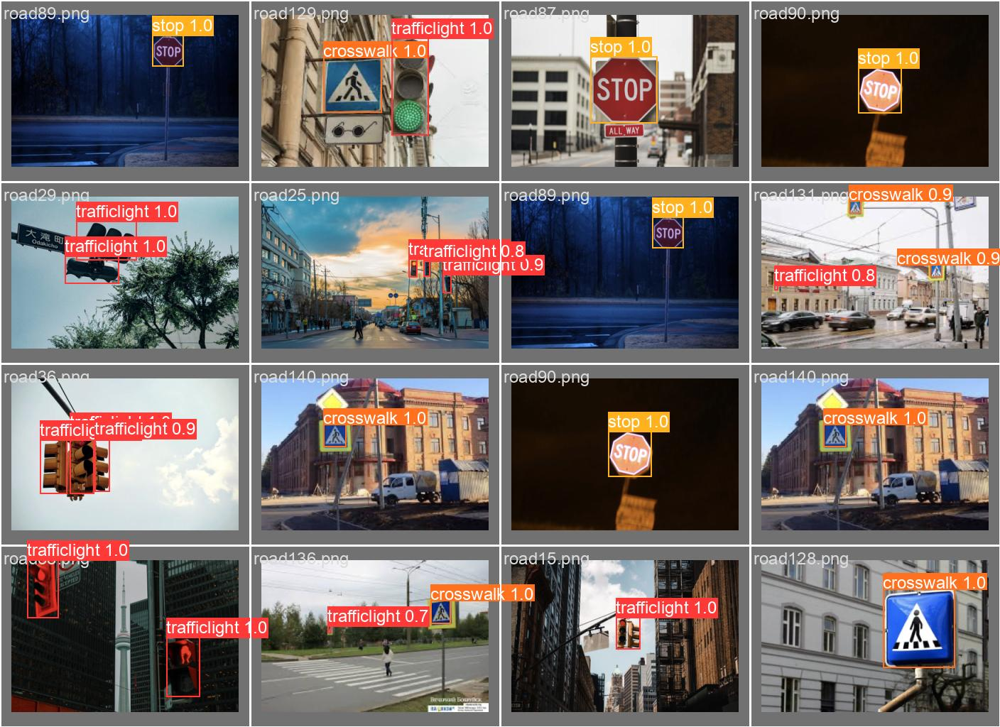

In [40]:
from IPython.display import Image, display
import os

run_dir = "/kaggle/working/yolov5/runs/train/roadsign_320s"

to_show = [
    "results.png",           # losses + metrics vs epochs
    "PR_curve.png",          # precision-recall curve
    "P_curve.png",           # precision vs conf
    "R_curve.png",           # recall vs conf
    "F1_curve.png",          # F1 vs conf
    "confusion_matrix.png",  # confusion matrix
    "val_batch0_pred.jpg",
    "val_batch1_pred.jpg",
    "val_batch2_pred.jpg",
]

for fn in to_show:
    p = os.path.join(run_dir, fn)
    if os.path.exists(p):
        print(f"Showing: {fn}")
        display(Image(filename=p))
    else:
        print(f"Missing: {fn}")


In [43]:
%%bash
RUN=/kaggle/working/yolov5/runs/train/roadsign_320s
CSV="$RUN/results.csv"
echo "Path: $CSV"
if [ -f "$CSV" ]; then
  echo "results.csv EXISTS"
  echo "First 5 lines:"
  head -n 5 "$CSV"
  echo "Last 5 lines:"
  tail -n 5 "$CSV"
else
  echo "results.csv MISSING"
fi


Path: /kaggle/working/yolov5/runs/train/roadsign_320s/results.csv
results.csv EXISTS
First 5 lines:
               epoch,      train/box_loss,      train/obj_loss,      train/cls_loss,   metrics/precision,      metrics/recall,     metrics/mAP_0.5,metrics/mAP_0.5:0.95,        val/box_loss,        val/obj_loss,        val/cls_loss,               x/lr0,               x/lr1,               x/lr2
                   0,            0.093272,            0.019776,            0.032348,              0.5253,             0.30595,                0.26,             0.10608,            0.065955,            0.013972,             0.01845,            0.070273,            0.003303,            0.003303
                   0,            0.093272,            0.019776,            0.032348,              0.5253,             0.30595,                0.26,             0.10608,            0.065955,            0.013972,             0.01845,            0.070273,            0.003303,            0.003303
                  

In [44]:
import os
import pandas as pd

run_dir = "/kaggle/working/yolov5/runs/train/roadsign_320s"
csv_path = os.path.join(run_dir, "results.csv")
df = pd.read_csv(csv_path)

# Clean column names (strip spaces)
df.columns = [c.strip() for c in df.columns]

# Identify columns of interest
cols = [
    "epoch",
    "metrics/precision", "metrics/recall",
    "metrics/mAP_0.5", "metrics/mAP_0.5:0.95",
    "train/box_loss", "train/obj_loss", "train/cls_loss",
    "val/box_loss", "val/obj_loss", "val/cls_loss",
]

present = [c for c in cols if c in df.columns]
print("Columns present:", present)

last = df.iloc[-1]
print("\nLast epoch metrics:")
for c in present:
    print(f" {c}: {last[c]}")

# Best by mAP50-95
key = "metrics/mAP_0.5:0.95"
if key in df.columns:
    best_idx = df[key].idxmax()
    best = df.loc[best_idx]
    print(f"\nBest epoch by {key}: {int(best['epoch']) if 'epoch' in best else best_idx}")
    for c in present:
        print(f" {c}: {best[c]}")


Columns present: ['epoch', 'metrics/precision', 'metrics/recall', 'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95', 'train/box_loss', 'train/obj_loss', 'train/cls_loss', 'val/box_loss', 'val/obj_loss', 'val/cls_loss']

Last epoch metrics:
 epoch: 99.0
 metrics/precision: 0.98649
 metrics/recall: 0.98473
 metrics/mAP_0.5: 0.99389
 metrics/mAP_0.5:0.95: 0.90058
 train/box_loss: 0.010535
 train/obj_loss: 0.0041896
 train/cls_loss: 0.0003462
 val/box_loss: 0.0083824
 val/obj_loss: 0.0025285
 val/cls_loss: 0.00020887

Best epoch by metrics/mAP_0.5:0.95: 99
 epoch: 99.0
 metrics/precision: 0.98649
 metrics/recall: 0.98473
 metrics/mAP_0.5: 0.99389
 metrics/mAP_0.5:0.95: 0.90058
 train/box_loss: 0.010535
 train/obj_loss: 0.0041896
 train/cls_loss: 0.0003462
 val/box_loss: 0.0083824
 val/obj_loss: 0.0025285
 val/cls_loss: 0.00020887


Showing: results.png


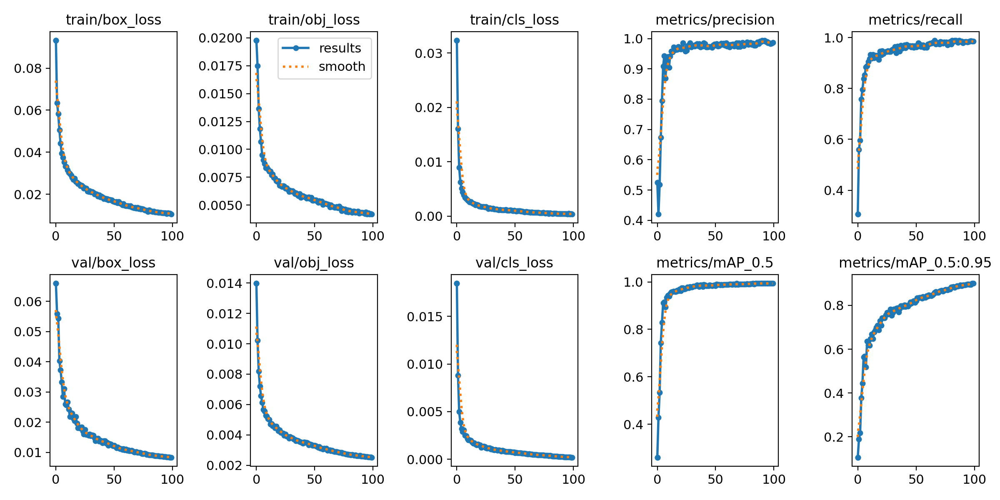

Showing: PR_curve.png


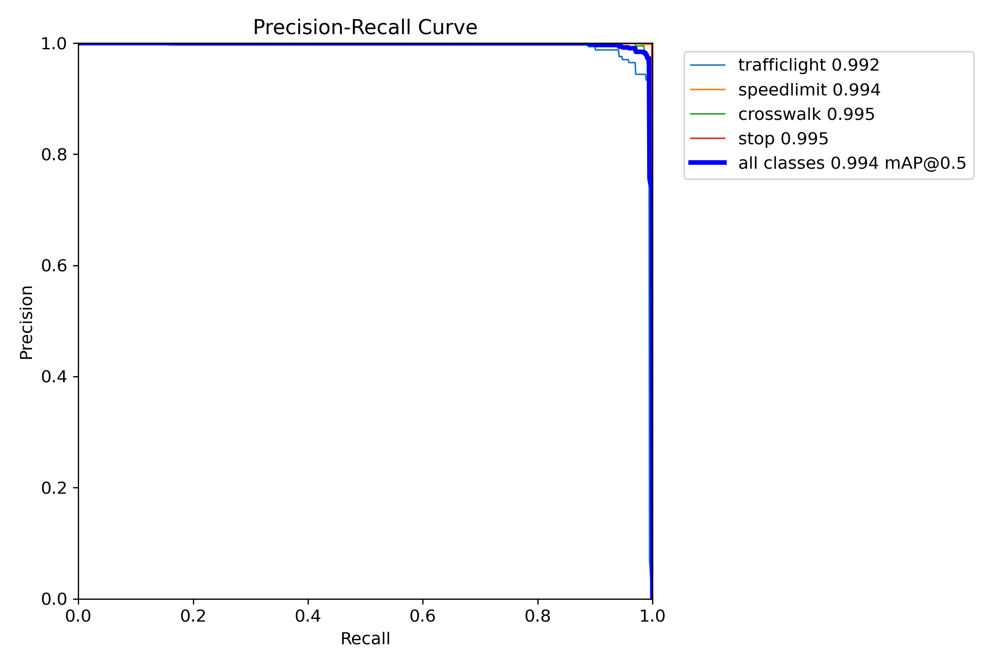

Showing: P_curve.png


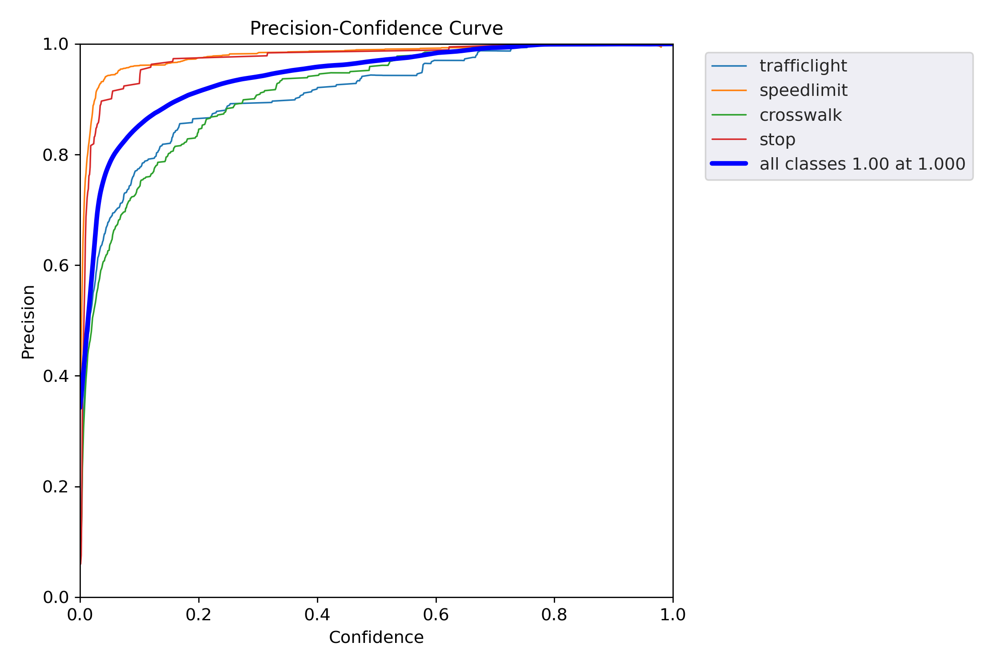

Showing: R_curve.png


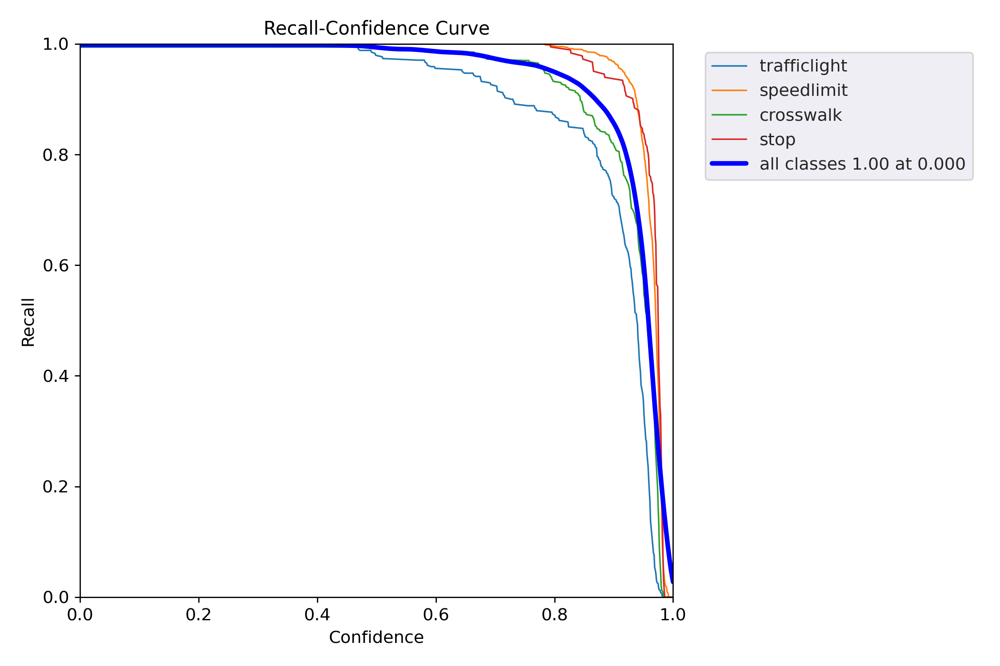

Showing: F1_curve.png


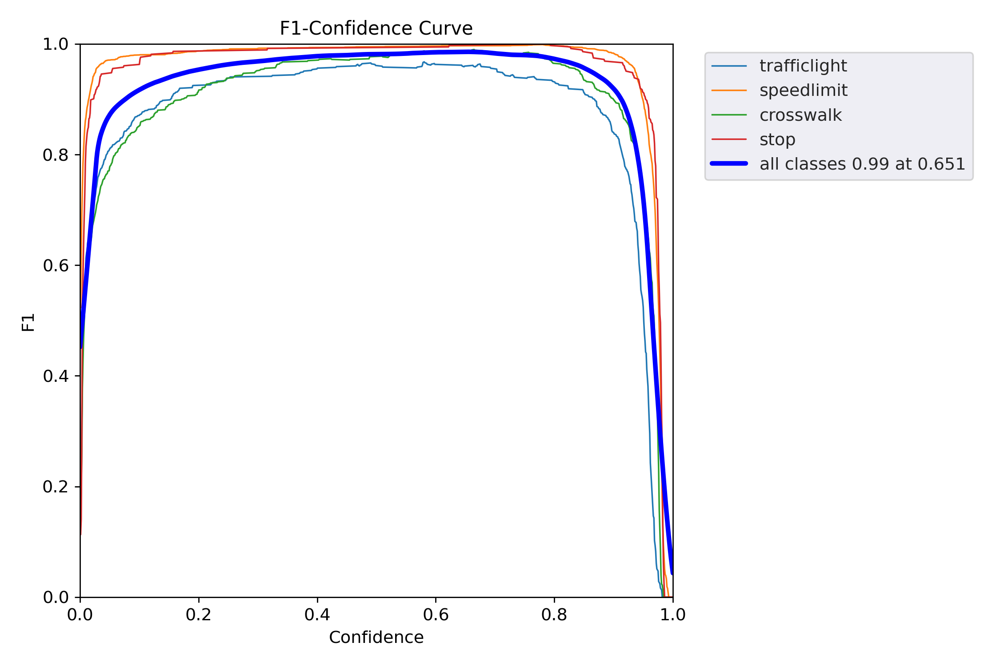

Showing: confusion_matrix.png


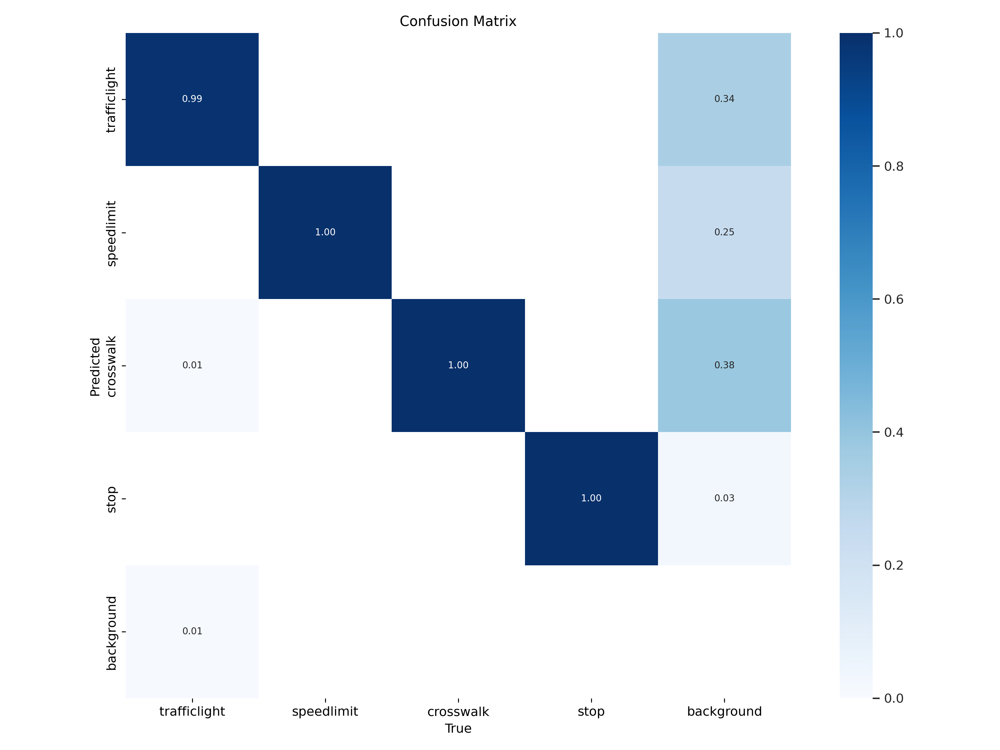

In [45]:
from IPython.display import Image, display
import os

run_dir = "/kaggle/working/yolov5/runs/train/roadsign_320s"
for fn in ["results.png","PR_curve.png","P_curve.png","R_curve.png","F1_curve.png","confusion_matrix.png"]:
    p = os.path.join(run_dir, fn)
    if os.path.exists(p):
        print("Showing:", fn)
        display(Image(filename=p))


In [46]:
import os
import pandas as pd

run_dir = "/kaggle/working/yolov5/runs/train/roadsign_320s"
csv_path = os.path.join(run_dir, "results.csv")
assert os.path.exists(csv_path), f"Missing results.csv at {csv_path}"

df = pd.read_csv(csv_path)
# Normalize column names
df.columns = [c.strip() for c in df.columns]
last = df.iloc[-1]

# Safely fetch columns if present
mAP50 = last.get("metrics/mAP_0.5", None)
mAP5095 = last.get("metrics/mAP_0.5:0.95", None)
prec = last.get("metrics/precision", None)
rec = last.get("metrics/recall", None)

print("Final detection metrics (last epoch):")
print(f" mAP@0.5: {mAP50 if mAP50 is not None else '(not logged)'}")
print(f" mAP@0.5:0.95: {mAP5095 if mAP5095 is not None else '(not logged)'}")
print(f" Precision: {prec if prec is not None else '(not logged)'}")
print(f" Recall: {rec if rec is not None else '(not logged)'}")


Final detection metrics (last epoch):
 mAP@0.5: 0.99389
 mAP@0.5:0.95: 0.90058
 Precision: 0.98649
 Recall: 0.98473


In [47]:
from ultralytics import YOLO  # For YOLOv8, or use torch.load for YOLOv5
import torch

# For YOLOv5, load the model and run validation
# If using YOLOv5 repo:
import sys
sys.path.append('/kaggle/working/yolov5')
from val import run as val_run

weights = '/kaggle/working/yolov5/runs/train/roadsign_320s/weights/best.pt'
data = '/kaggle/working/roadsign.yaml'

# Run validation and get results
d = val_run(weights=weights, data=data, save_json=True, verbose=True)
# d['metrics'] contains class-wise metrics

# Print class-wise metrics
names = ['trafficlight', 'speedlimit', 'crosswalk', 'stop']
print('Class-wise metrics:')
for i, name in enumerate(names):
    print(f"Class: {name}")
    print(f" Precision: {d['metrics']['precision'][i]:.4f}")
    print(f" Recall:    {d['metrics']['recall'][i]:.4f}")
    print(f" mAP@0.5:   {d['metrics']['ap50'][i]:.4f}")
    print(f" mAP@0.5:0.95: {d['metrics']['ap'][i]:.4f}")
    print()


YOLOv5 🚀 v7.0-432-g725b922e Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /kaggle/working/data/labels.cache... 1754 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1754/1754 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 55/55 [00:17<00:00,  3.14it/s]
                   all       1754       2488      0.968      0.935      0.974       0.79
          trafficlight       1754        340      0.952      0.871      0.958      0.654
            speedlimit       1754       1566      0.985      0.994      0.993      0.886
             crosswalk       1754        400      0.959       0.94      0.976      0.773
                  stop       1754        182      0.975      0.934      0.969      0.845
Speed: 0.1ms pre-process, 2.5ms inference, 1.4ms NMS per image at shape (32, 3, 640, 640)
/usr/local/li

loading annotations into memory...
Class-wise metrics:
Class: trafficlight


TypeError: tuple indices must be integers or slices, not str

In [48]:
import pandas as pd

# Console output se values copy kiye hain
data = [
    ["trafficlight", 1754, 340, 0.952, 0.871, 0.958, 0.654],
    ["speedlimit",   1754, 1566, 0.985, 0.994, 0.993, 0.886],
    ["crosswalk",    1754, 400, 0.959, 0.940, 0.976, 0.773],
    ["stop",         1754, 182, 0.975, 0.934, 0.969, 0.845],
]
columns = ["Class", "Images", "Instances", "Precision", "Recall", "mAP@0.5", "mAP@0.5:0.95"]
df = pd.DataFrame(data, columns=columns)
print(df)


          Class  Images  Instances  Precision  Recall  mAP@0.5  mAP@0.5:0.95
0  trafficlight    1754        340      0.952   0.871    0.958         0.654
1    speedlimit    1754       1566      0.985   0.994    0.993         0.886
2     crosswalk    1754        400      0.959   0.940    0.976         0.773
3          stop    1754        182      0.975   0.934    0.969         0.845


In [54]:
import torch
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import itertools

In [55]:
# Load model first
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/kaggle/working/yolov5/runs/train/roadsign_320s/weights/best.pt', force_reload=True)

# Then set backend (important: after model load)
matplotlib.use('Agg')  # Non-interactive backend for notebooks/servers

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 v7.0-432-g725b922e Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 v7.0-432-g725b922e Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/kaggle/working/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is

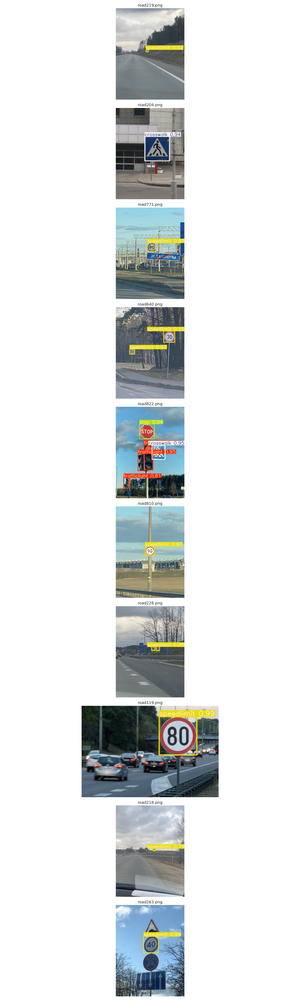

In [71]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import itertools

# Load your trained YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/kaggle/working/yolov5/runs/train/roadsign_320s/weights/best.pt', force_reload=True)

# Get sorted list of image filenames (first 10 in sequence)
img_dir = '/kaggle/working/data/images'
# imgs = sorted([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])[:10]
import random
imgs = random.sample([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))], 10)


fig, ax = plt.subplots(len(imgs), 1, figsize=(15, 5 * len(imgs)))

for i, imgname in enumerate(imgs):
    img_path = os.path.join(img_dir, imgname)
    img = cv2.imread(img_path)
    results = model(img)
    rendered = results.render()[0]

    ax[i].imshow(cv2.cvtColor(rendered, cv2.COLOR_BGR2RGB))
    ax[i].set_title(imgname, fontsize=14)
    ax[i].axis('off')

plt.tight_layout()
plt.savefig('detections_grid.png')
from IPython.display import Image, display
display(Image('detections_grid.png'))



Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 v7.0-432-g725b922e Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/kaggle/working/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is

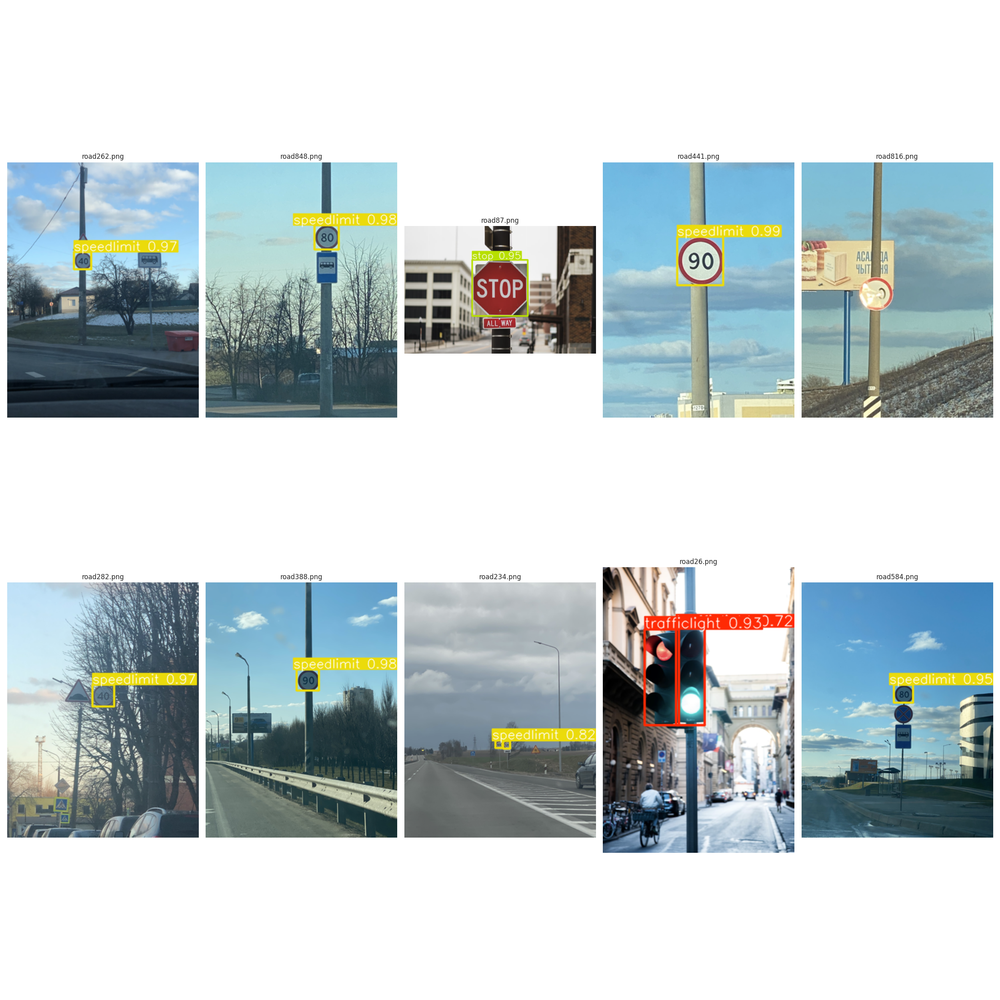

In [72]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import itertools

# Load your trained YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/kaggle/working/yolov5/runs/train/roadsign_320s/weights/best.pt', force_reload=True)

# Get sorted list of image filenames (first 10 in sequence)
img_dir = '/kaggle/working/data/images'
# imgs = sorted([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])[:10]
import random
imgs = random.sample([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))], 10)


fig, ax = plt.subplots(2, 5, figsize=(25, 25))

for i, imgname in enumerate(imgs):
    img_path = os.path.join(img_dir, imgname)
    img = cv2.imread(img_path)
    results = model(img)
    # results.render() returns a list with one image (BGR)
    rendered = results.render()[0]
    row, col = divmod(i, 5)
    ax[row, col].imshow(cv2.cvtColor(rendered, cv2.COLOR_BGR2RGB))
    ax[row, col].set_title(imgname, fontsize=12)
    ax[row, col].axis('off')

plt.tight_layout()
plt.savefig('detections_grid.png')
from IPython.display import Image, display
display(Image('detections_grid.png'))
